In [1]:
import os
import sys

In [2]:
lib_paths = ['../src/', '../cifar-10.1-pytorch/', '../data-copying/', '../PyTorch_CIFAR10/']
for path in lib_paths:
    if os.path.abspath(path) not in sys.path:
        sys.path.insert(0, os.path.abspath(path))
print(sys.path)

['/work/cybai2020/PyTorch-StudioGAN/PyTorch_CIFAR10', '/work/cybai2020/PyTorch-StudioGAN/data-copying', '/work/cybai2020/PyTorch-StudioGAN/cifar-10.1-pytorch', '/work/cybai2020/PyTorch-StudioGAN/src', '/work/cybai2020/PyTorch-StudioGAN/notebooks', '/home/cybai2020/miniconda3/envs/studiogan/lib/python37.zip', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/lib-dynload', '', '/home/cybai2020/.local/lib/python3.7/site-packages', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/site-packages', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/site-packages/IPython/extensions', '/home/cybai2020/.ipython']


In [3]:
%ls /work/cybai2020

PyTorch-StudioGAN/  hq_list_eval_partition.txt
celeba-hq/          list_eval_partition.txt


In [4]:
from matplotlib import pyplot as plt
import glob
from importlib import reload
import yaml

import torch
from torch.nn import Parameter as P
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

import misc
reload(misc)
from models.retinaface import RetinaFaceProject
from models.reID import gan_proj_ft_net
from metrics.feat_extract_models import alexnet, inception, vgg

In [5]:
sys.path.insert(0, os.path.abspath('../Pytorch_Retinaface'))
from config import cfg_mnet, cfg_re50
sys.path.pop(0)
print(sys.path)

['/work/cybai2020/PyTorch-StudioGAN/PyTorch_CIFAR10', '/work/cybai2020/PyTorch-StudioGAN/data-copying', '/work/cybai2020/PyTorch-StudioGAN/cifar-10.1-pytorch', '/work/cybai2020/PyTorch-StudioGAN/src', '/work/cybai2020/PyTorch-StudioGAN/notebooks', '/home/cybai2020/miniconda3/envs/studiogan/lib/python37.zip', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/lib-dynload', '', '/home/cybai2020/.local/lib/python3.7/site-packages', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/site-packages', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/site-packages/IPython/extensions', '/home/cybai2020/.ipython']


In [6]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = 'cuda'
torch.backends.cudnn.benchmark = True

In [7]:
'''
proj_model = inception.WrappedInception3().eval().to(device)
'''

'''
proj_model = RetinaFaceProject(extract_method='maxpool', cfg=cfg_re50, phase='test')
pretrained_path = '../Pytorch_Retinaface/weights/Resnet50_Final.pth'
proj_model = misc.load_model(proj_model, pretrained_path=pretrained_path, load_to_cpu=False)
proj_model = proj_model.eval().to(device)
'''

with open('../Person_reID_baseline_pytorch/model/ft_ResNet50/opts.yaml', 'r') as stream:
    config = yaml.safe_load(stream)
proj_model = gan_proj_ft_net(config['nclasses'], stride = config['stride'])
proj_model.load_state_dict(torch.load('../Person_reID_baseline_pytorch/model/ft_ResNet50/net_last.pth'))
proj_model = proj_model.eval().to(device)

In [8]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(0.5, 0.5)])

celebahq_64_train_dset = datasets.ImageFolder('../data/CELEBA-HQ_64/train', transform=transform)
celebahq_64_test_dset = datasets.ImageFolder('../data/CELEBA-HQ_64/valid', transform=transform)

celebahq_128_train_dset = datasets.ImageFolder('../data/CELEBA-HQ_128/train', transform=transform)
celebahq_128_test_dset = datasets.ImageFolder('../data/CELEBA-HQ_128/valid', transform=transform)

In [9]:
celebahq_64_dls = {k: DataLoader(v, batch_size=50, shuffle=False, num_workers=8, drop_last=False)
                   for k, v in {'train': celebahq_64_train_dset, 'test': celebahq_64_test_dset}.items()}
celebahq_128_dls = {k: DataLoader(v, batch_size=50, shuffle=False, num_workers=8, drop_last=False)
                    for k, v in {'train': celebahq_128_train_dset, 'test': celebahq_128_test_dset}.items()}

In [ ]:
celebahq_64_feats = {}
for dset_name, dl in celebahq_64_dls.items():
    print(dset_name)
    _, feats_, logits_ = misc.project(dl, proj_model, n_samples=None, to_numpy=True, return_logits=None)
    # top_1_conf = np.amax(softmax(logits_, axis=-1), axis=-1)
    celebahq_64_feats[dset_name] = feats_
    
celebahq_128_feats = {}
for dset_name, dl in celebahq_128_dls.items():
    print(dset_name)
    _, feats_, logits_ = misc.project(dl, proj_model, n_samples=None, to_numpy=True, return_logits=None)
    # top_1_conf = np.amax(softmax(logits_, axis=-1), axis=-1)
    celebahq_128_feats[dset_name] = feats_

train
test


In [ ]:
celebahq_64_feats['test'].shape, celebahq_64_feats['train'].shape

In [ ]:
nnds, _ = misc.calculate_knnd_numpy(target_feats=celebahq_64_feats['test'], 
                                    ref_feats=celebahq_64_feats['train'])
nnds.shape

In [ ]:
plt.figure(figsize=(10, 9))
plt.hist(nnds, bins=50)

In [14]:
def wrapper(runname, dset):
    if len(glob.glob(f'../checkpoints/{runname}/model=G_ema-best-weights-step=*.pth')) > 0:
        ema_g_path = glob.glob(f'../checkpoints/{runname}/model=G_ema-best-weights-step=*.pth')[0]
    else:
        ema_g_path = glob.glob(f'../checkpoints/{runname}/model=G-best-weights-step=*.pth')[0]
    config_path = f"../src/configs/{dset}/{runname.split('-')[0]}.json"
    sampler = misc.construct_sampler(ema_g_path, config_path, device)
    return sampler

In [15]:
biggan_128_accu1_sampler = wrapper('BigGAN-train-2021_04_24_10_27_56', 'CELEBA-HQ_128')
biggan_128_accu2_sampler = wrapper('BigGAN-train-2021_04_24_10_16_15', 'CELEBA-HQ_128')

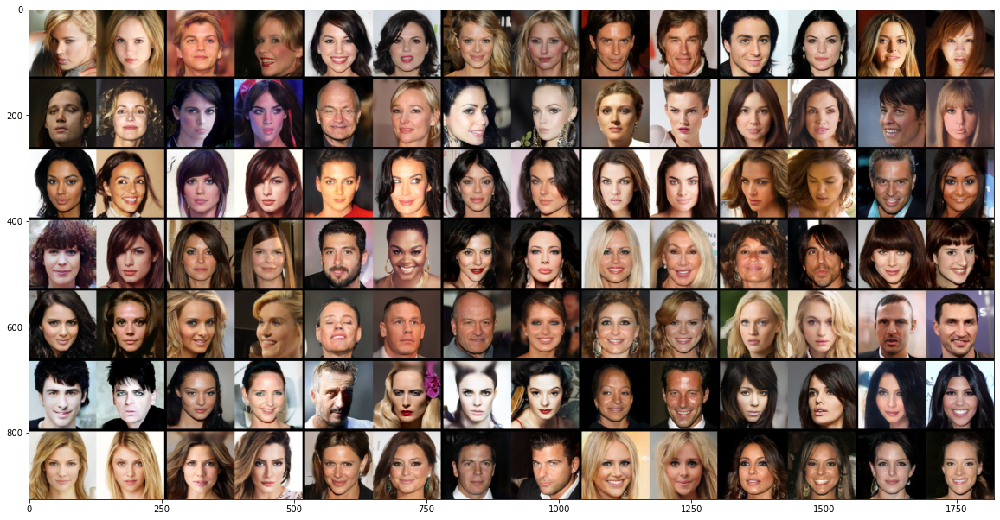

In [16]:
# reID
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['train'], proj_model,
                           conditional=False)

(array([ 8., 12., 13.,  5.,  4.,  2.,  3.,  1.,  0.,  2.]),
 array([0.03378797, 0.049399  , 0.06501003, 0.08062105, 0.09623208,
        0.11184311, 0.12745413, 0.14306517, 0.15867619, 0.17428723,
        0.18989825], dtype=float32),
 <BarContainer object of 10 artists>)

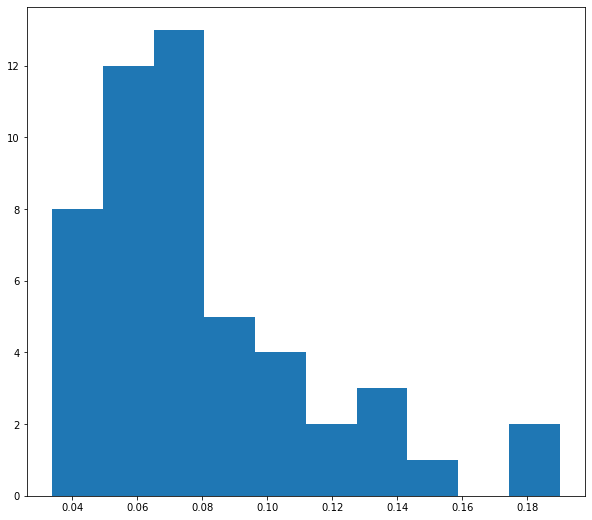

In [18]:
plt.figure(figsize=(10, 9))
plt.hist(nnds)

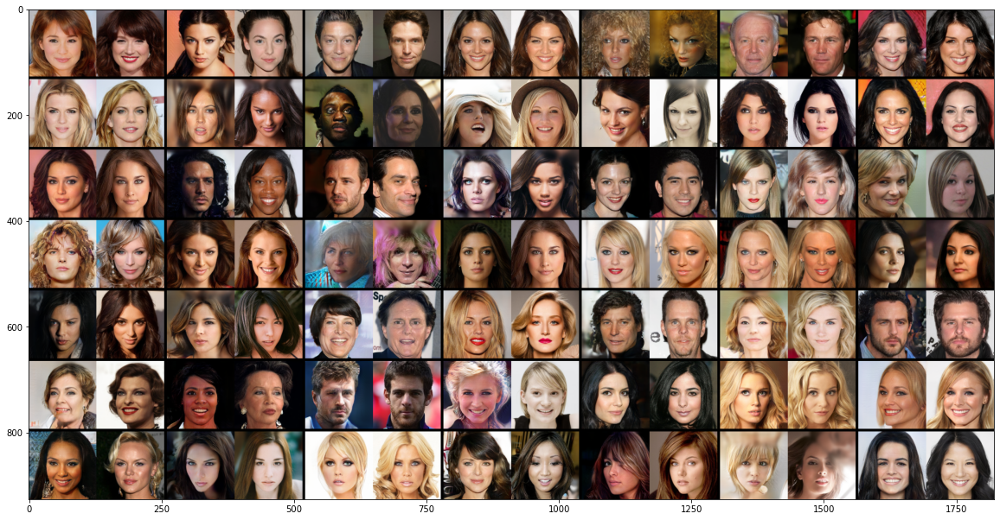

In [33]:
# inception_v3
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['train'], proj_model,
                           conditional=True)

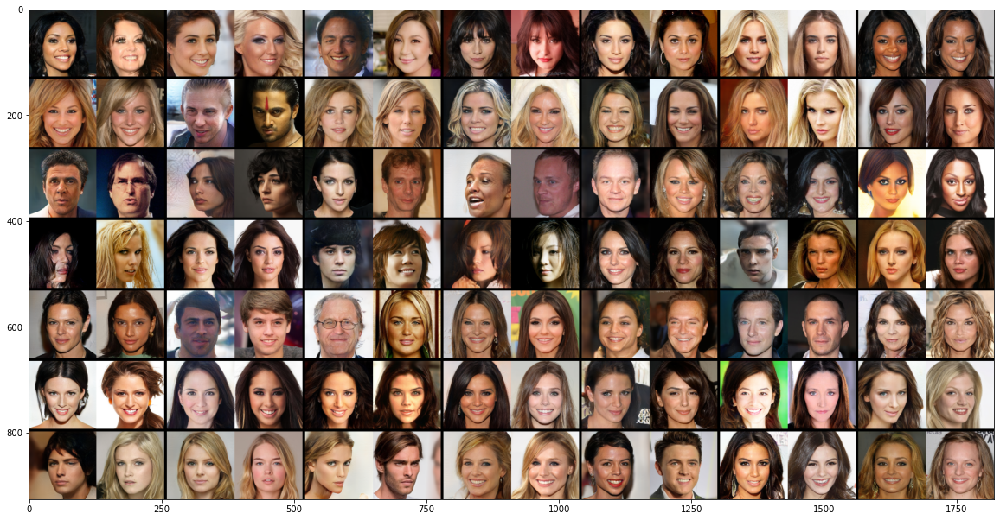

In [19]:
# class
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['train'], proj_model,
                           conditional=False)

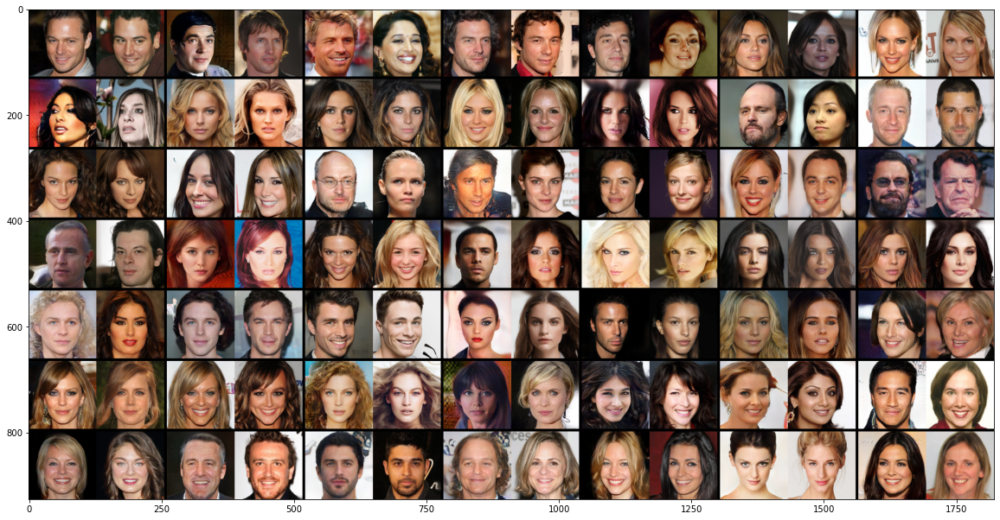

In [24]:
# maxpool
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['train'], proj_model,
                           conditional=False)

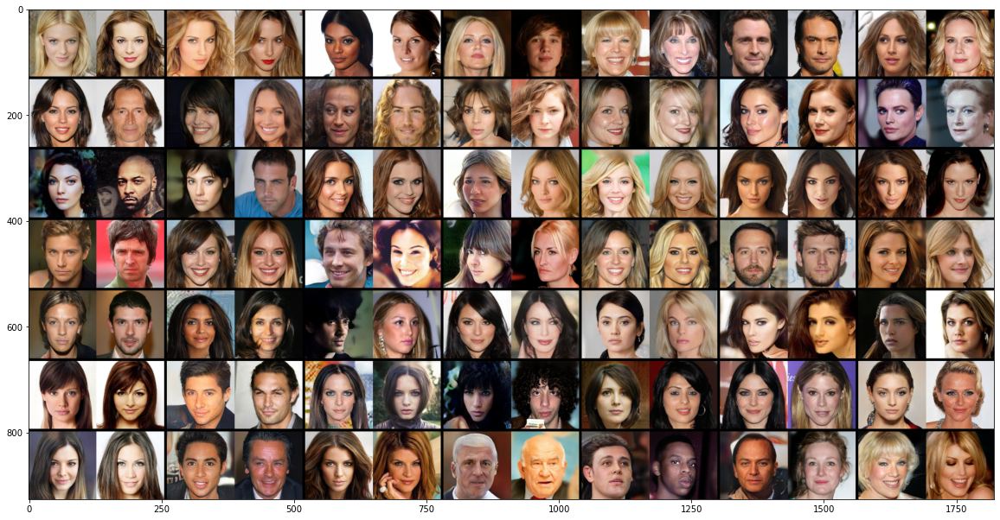

In [21]:
# avgpool
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['train'], proj_model,
                           conditional=False)

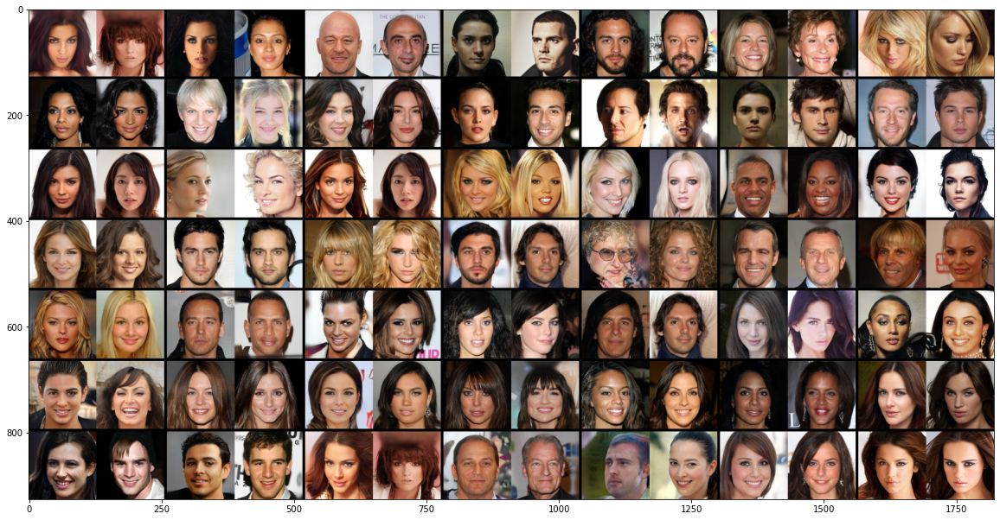

In [18]:
# reID
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['test'], proj_model, conditional=False)

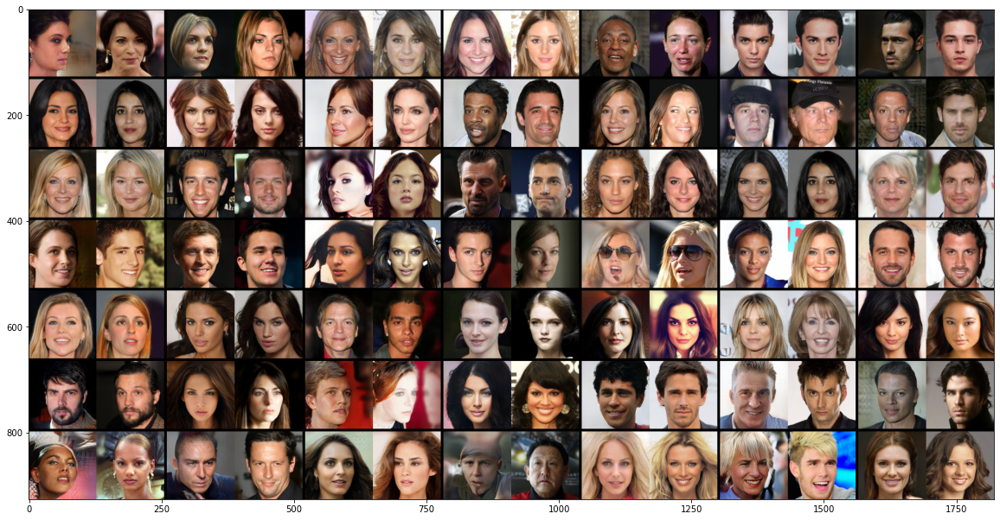

In [34]:
# inception_v3
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['test'], proj_model, 
                           conditional=True)

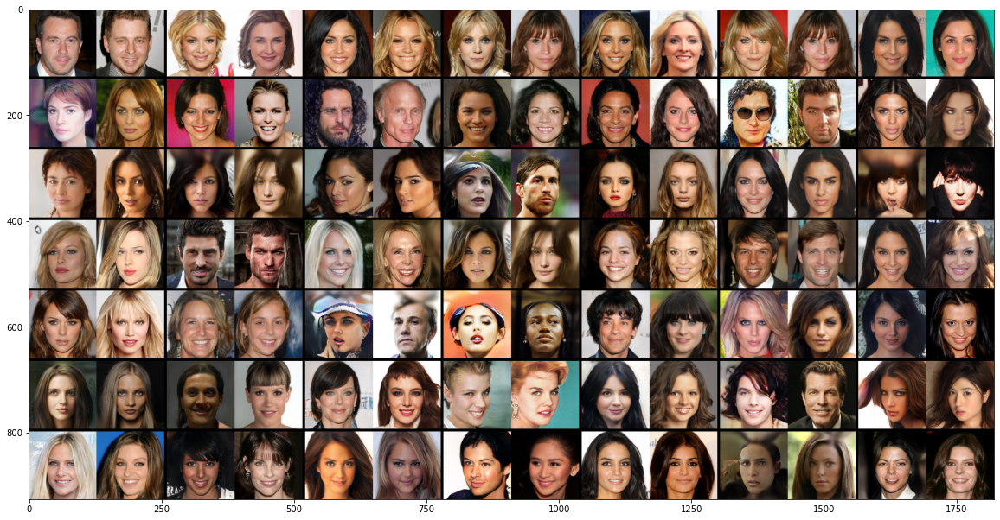

In [20]:
# class
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['test'], proj_model, conditional=False)

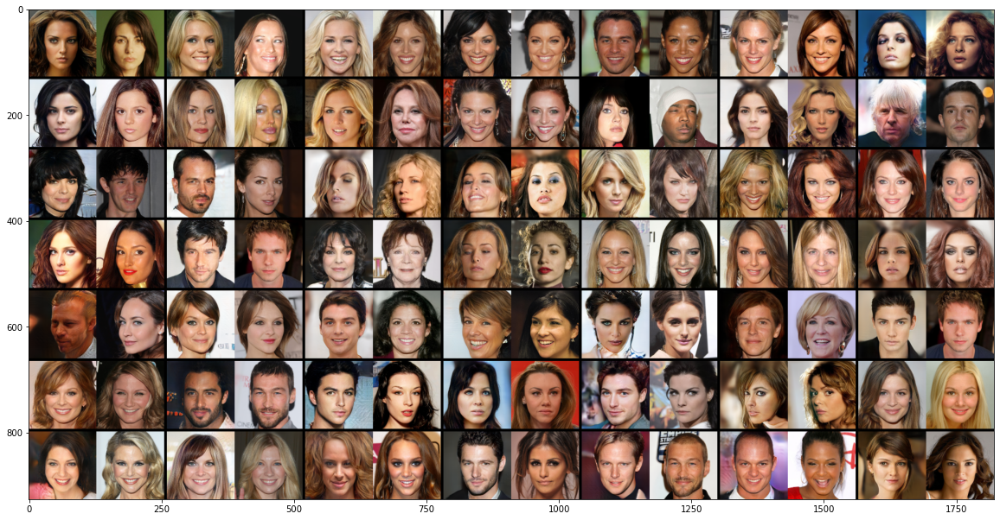

In [25]:
# maxpool
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['test'], proj_model, conditional=False)

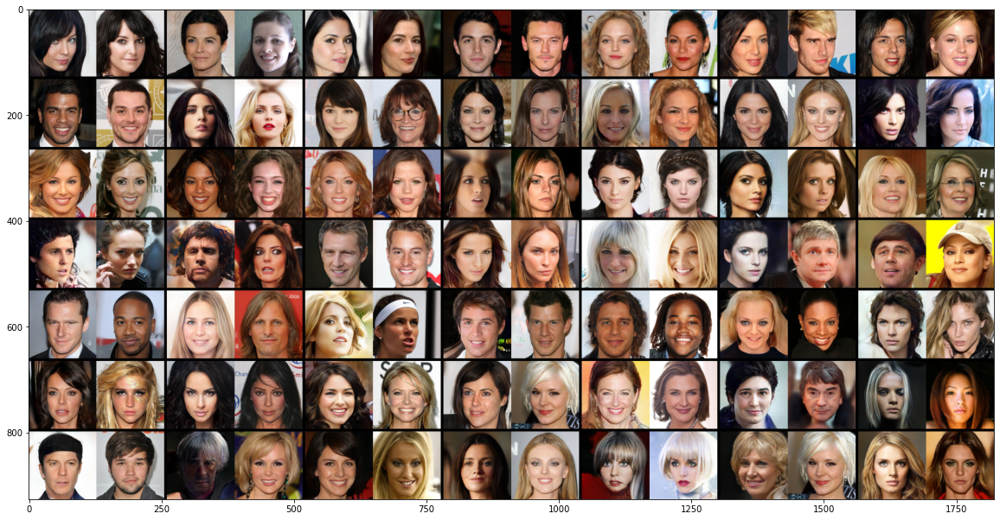

In [23]:
# avgpool
nnds = misc.visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['test'], proj_model, conditional=False)